### Laboratorium 6 - część projektowa

W tej części zajmiesz się wykorzystaniem punktów kluczowych do łączenia obrazów (_image stitching_). Celem zadania jest przetestowanie możliwości detekcji i parowania punktów kluczowych w celu łączenia obrazów. Istotne jest, by samodzielnie przejść całą ścieżkę: od detekcji punktów kluczowych i wyznaczenia ich desktryptorów, przez ich parowanie i znalezienie transformacji, po finalne połączenie obrazów. Rozwiązania oparte o gotowce w stylu black-box nie będą oceniane.

Wykonaj serię zdjęć dowolnej wybranej przez siebie **statycznej** sceny. Może to być niemal dowolny widok o dowolnej skali: panorama miasta, swojego pokoju, powierzchni biurka - ważne, by pozyskane obrazy umożliwiały (1) użycie algorytmu SIFT, oraz (2) wykonanie transformacji geometrycznej.

Wykonaj 4-5 zdjęć, spośród których pierwsze (nazwij je `base`) niech przedstawia \"główny\" widok sceny, a pozostałe (o nazwie `offset_{index}`) niech cechują się coraz większym przesunięciem kamery względem `base`. Proponowane różnice:
* nieznaczne przesunięcie (o ~połowę szerokości klatki),
* większe przesunięcie (o 3/4 szerokości lub więcej),
* przesunięcie z rotacją w osi kamery,
* (jeśli to możliwe) przybliżenie/oddalenie kamery.

Wykorzystaj algorytmy opracowane do realizacji zadania 3 (zwłaszcza 3b) w celu przekształcania obrazów `offset_x` do geometrii `base`. Upewnij się, że wymiary wynikowych obrazów są wystarczające do zmieszczenia obu składowych.

*Czy każdą parę `offset_i`-`base` udało się połączyć? Jeśli dla którejś pary metoda zawiodła, to dlaczego?*  
*Jaka była jakość dopasowania? Na jakiej podstawie ją określasz?*

In [310]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

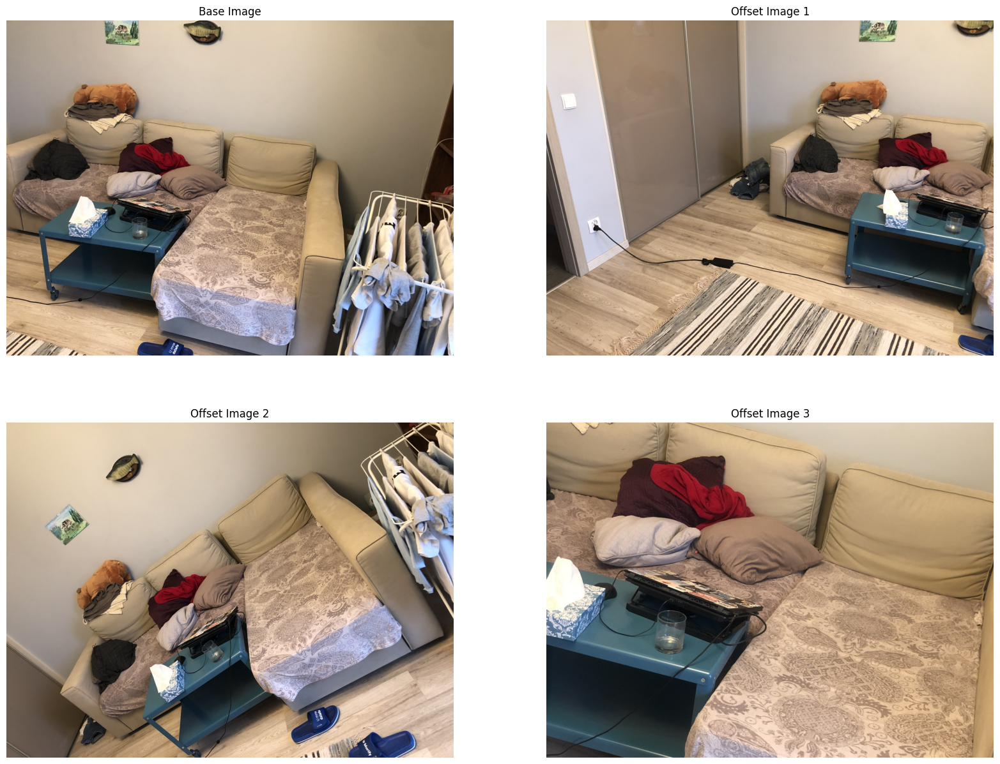

In [311]:
base_img = cv2.imread("base.jpg")
base_img = cv2.resize(base_img, (0, 0), fx=0.5, fy=0.5)
offset_imgs = []
for i in [1, 2, 3]:
    offset_img = cv2.imread(f"offset_{i}.jpg")
    offset_img = cv2.resize(offset_img, (0, 0), fx=0.5, fy=0.5)
    offset_imgs.append(offset_img)

fig, ax = plt.subplots(2, 2, figsize=(20, 15))
ax = ax.flatten()
ax[0].imshow(cv2.cvtColor(base_img, cv2.COLOR_BGR2RGB))
ax[0].set_title("Base Image")
ax[0].axis("off")
for i in range(3):
    ax[i + 1].imshow(cv2.cvtColor(offset_imgs[i], cv2.COLOR_BGR2RGB))
    ax[i + 1].set_title(f"Offset Image {i+1}")
    ax[i + 1].axis("off")
plt.show()

In [312]:
def try_stitching(query, contrastThreshold, edgeThreshold):
    fig, ax = plt.subplots(1, 2, figsize=(20, 15))
    ax[0].imshow(cv2.cvtColor(base_img, cv2.COLOR_BGR2RGB))
    ax[0].set_title("Base Image")
    ax[1].imshow(cv2.cvtColor(query, cv2.COLOR_BGR2RGB))
    ax[1].set_title("Offset Image")

    sift = cv2.SIFT_create(
        contrastThreshold=contrastThreshold, edgeThreshold=edgeThreshold
    )

    keypoints1, descriptors1 = sift.detectAndCompute(base_img, mask=None)
    keypoints2, descriptors2 = sift.detectAndCompute(query, mask=None)

    bf = cv2.BFMatcher(cv2.NORM_L2)

    matches = bf.knnMatch(descriptors1, descriptors2, k=2)

    # Lowe's ratio test
    good_matches = []
    for m in matches:
        # Lowe's ratio test removes ambiguous matches, that is the ones that are indisinguishable
        # from the second best match, hence checking if ratio is small enough
        if m[0].distance < 0.5 * m[1].distance:
            good_matches.append(m)
    matches = np.asarray(good_matches)

    image_matches_bf = cv2.drawMatches(
        base_img,
        keypoints1,
        query,
        keypoints2,
        matches[:, 0],
        None,
        matchesThickness=5,
        matchColor=(0, 255, 0),
        singlePointColor=(0, 0, 255),
    )

    fig, ax = plt.subplots(1, 1, figsize=(20, 15))
    ax.imshow(cv2.cvtColor(image_matches_bf, cv2.COLOR_BGR2RGB))
    ax.set_title("Matches")

    if len(matches[:, 0]) >= 4:
        dst = np.float32([keypoints1[m.queryIdx].pt for m in matches[:, 0]]).reshape(
            -1, 1, 2
        )
        src = np.float32([keypoints2[m.trainIdx].pt for m in matches[:, 0]]).reshape(
            -1, 1, 2
        )

        H, masked = cv2.findHomography(src, dst, cv2.RANSAC, 5.0)

        dst = cv2.warpPerspective(
            query,
            H,
            (base_img.shape[1] + query.shape[1], query.shape[0]),
        )
        fig, ax = plt.subplots(3, 1, figsize=(20, 15))
        ax[0].imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
        ax[0].set_title("Warped Image")

        empty_canvas = np.zeros_like(dst)
        empty_canvas[0 : base_img.shape[0], 0 : base_img.shape[1]] = base_img

        alpha = 0.5
        blended_image = cv2.addWeighted(empty_canvas, alpha, dst, 1 - alpha, 0)
        ax[1].imshow(cv2.cvtColor(blended_image, cv2.COLOR_BGR2RGB))
        ax[1].set_title("Blended Image")

        dst_mask = (dst[:, :, 0] != 0) | (dst[:, :, 1] != 0) | (dst[:, :, 2] != 0)

        empty_canvas[dst_mask] = dst[dst_mask]
        ax[2].imshow(cv2.cvtColor(empty_canvas, cv2.COLOR_BGR2RGB))
        ax[2].set_title("Stitched")
    else:
        raise AssertionError("Can't find enough keypoints.")

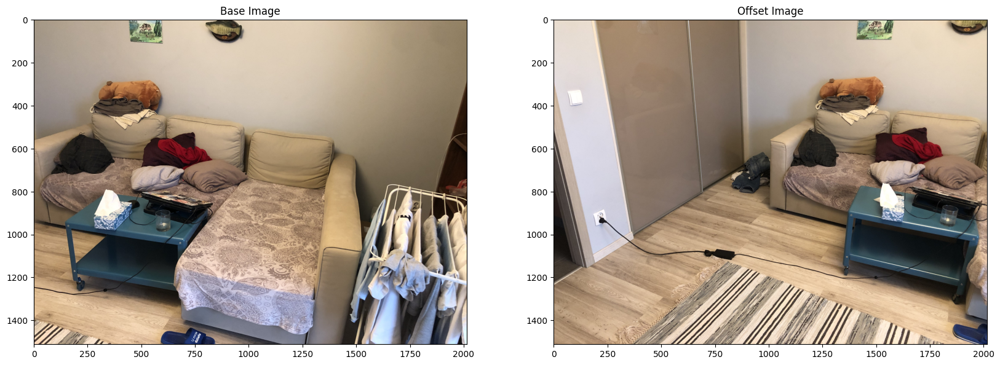

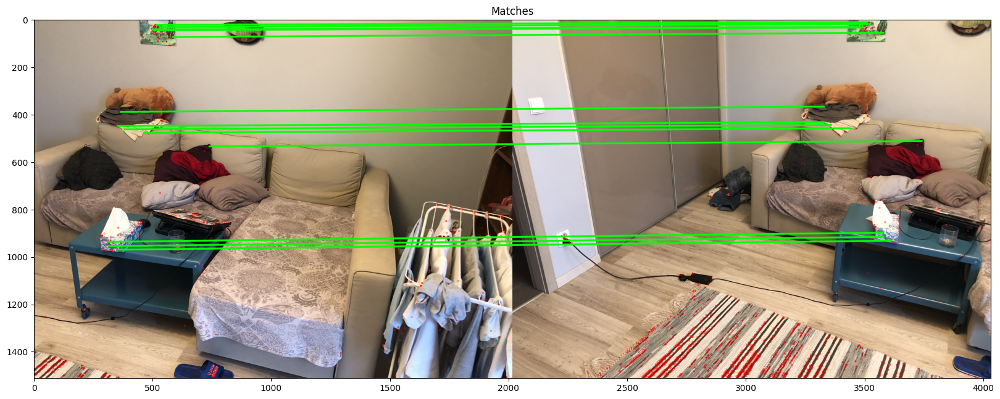

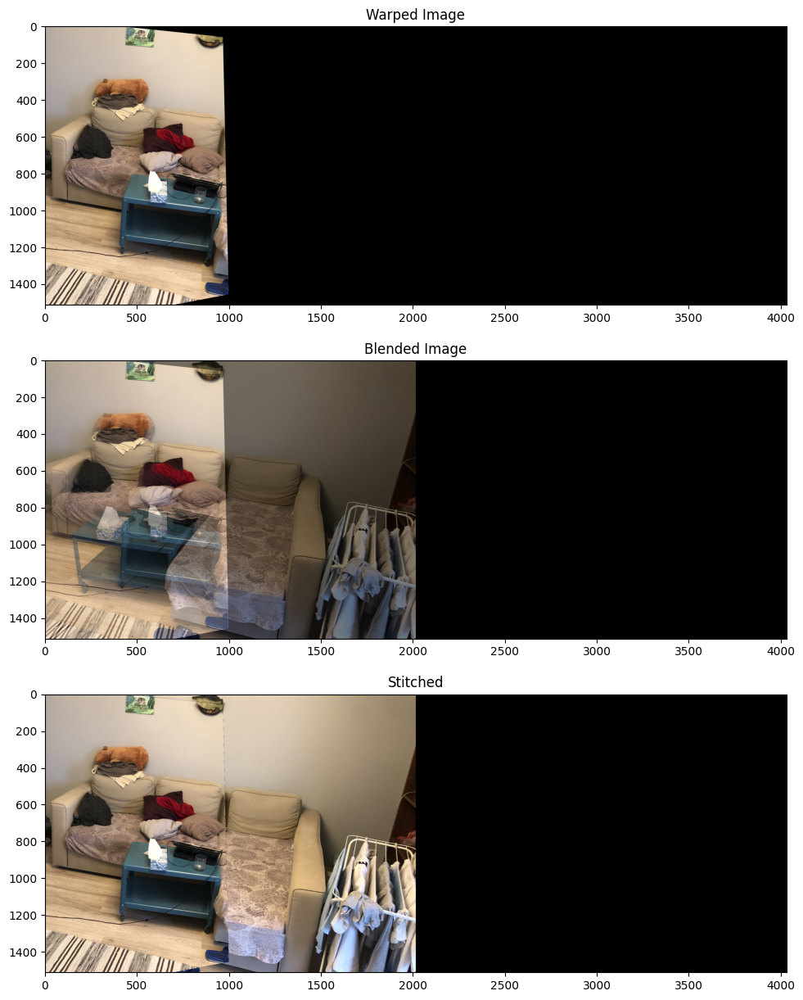

In [313]:
query = offset_imgs[0].copy()

contrastThreshold = 0.15
edgeThreshold = 10

try_stitching(query, contrastThreshold, edgeThreshold)

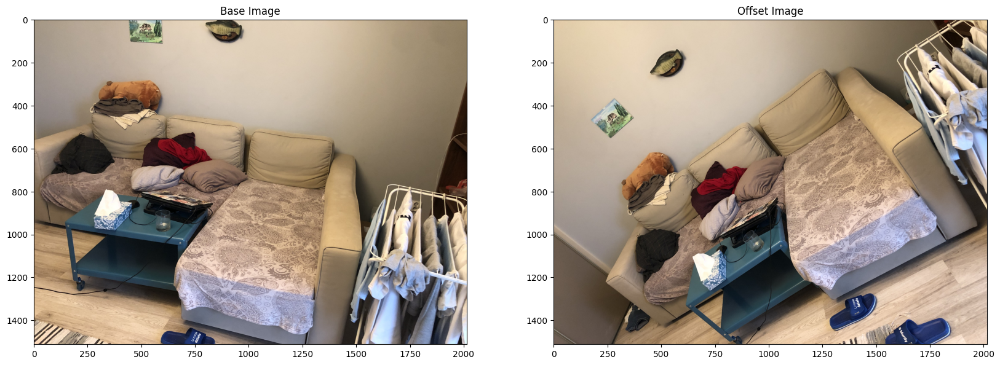

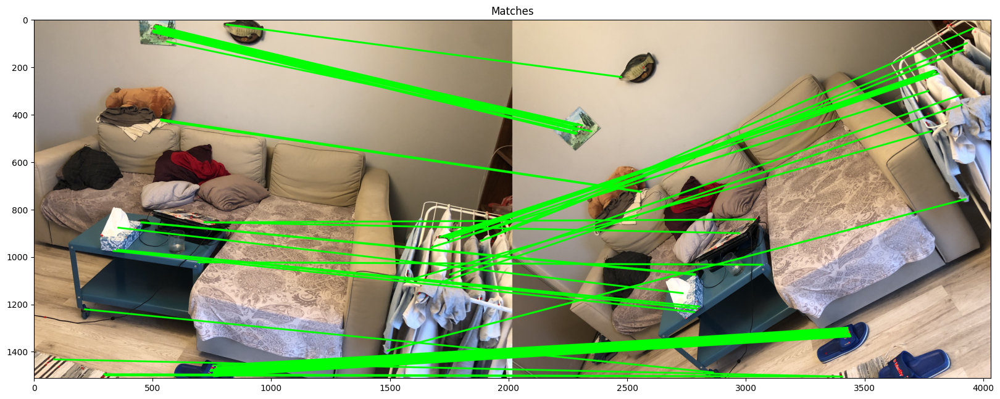

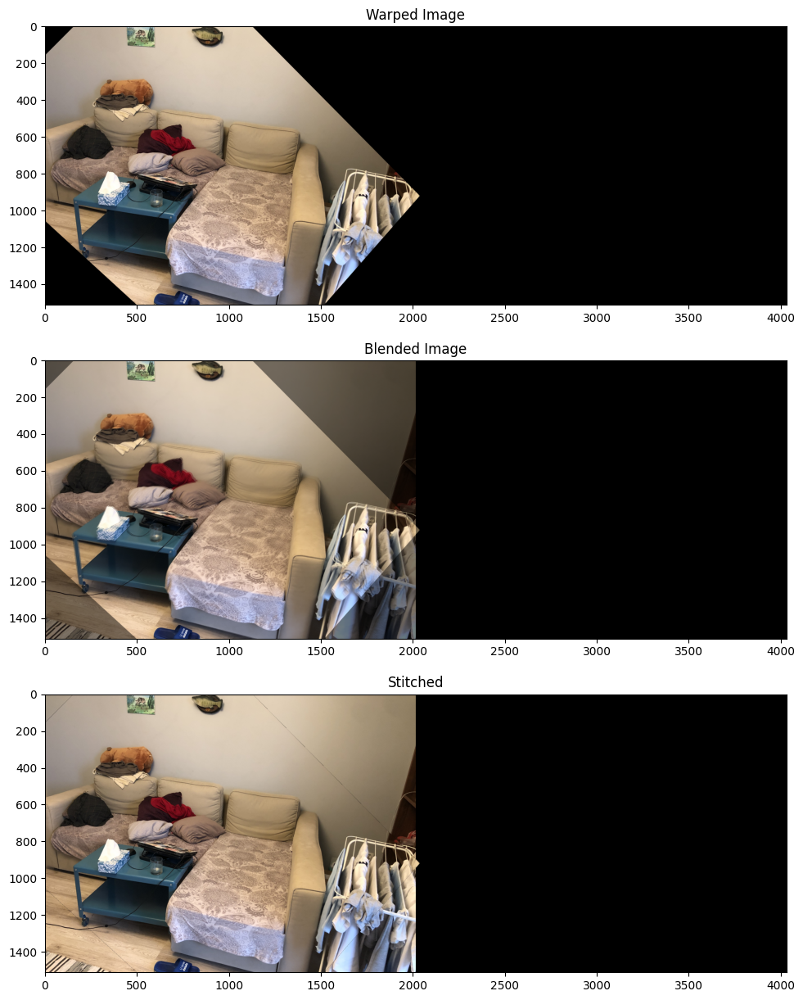

In [314]:
query_2 = offset_imgs[1].copy()
contrastThreshold = 0.2
edgeThreshold = 10
try_stitching(query_2, contrastThreshold, edgeThreshold)

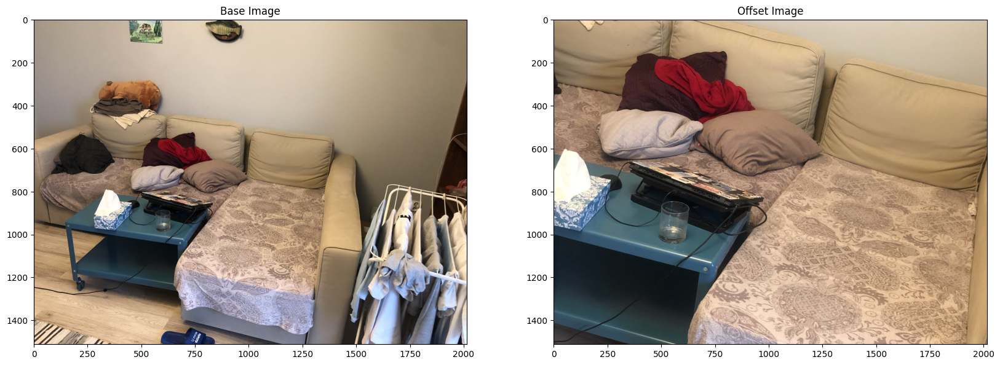

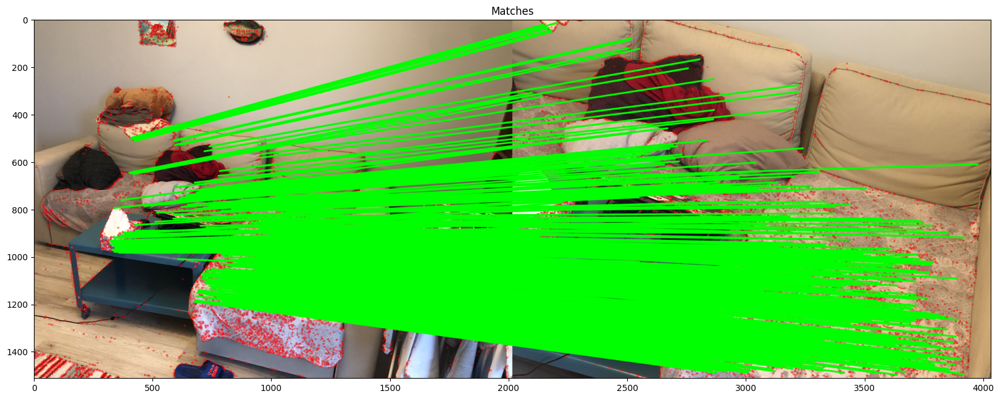

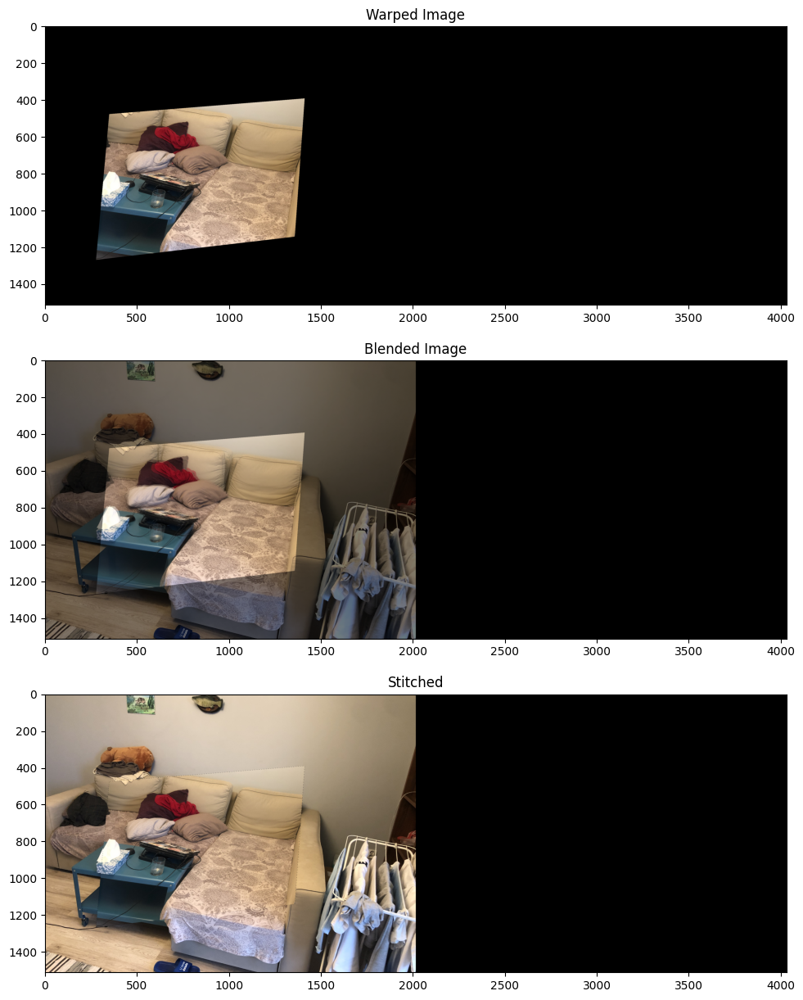

In [315]:
query_2 = offset_imgs[2].copy()
contrastThreshold = 0.05
edgeThreshold = 10
try_stitching(query_2, contrastThreshold, edgeThreshold)